In [80]:
# 单元格1：导入依赖库 + 创建img文件夹（若不存在，避免路径报错）+ 新增高斯噪声函数
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 配置Matplotlib中文显示（可选，避免图表中文乱码）
plt.rcParams["font.sans-serif"] = ["SimHei"]
plt.rcParams["axes.unicode_minus"] = False

In [81]:
def add_gaussian_noise(image, mean=0, var=0.005):
    """
    给图像添加高斯噪声，模拟相机传感器真实噪声场景
    :param image: 输入灰度/彩色图像（np.ndarray）
    :param mean: 高斯噪声均值（默认0，避免图像整体明暗偏移）
    :param var: 高斯噪声方差（默认0.005，值越大噪声越明显）
    :return: 带噪声图像（uint8）、单独归一化噪声矩阵（uint8）
    """
    # 转换图像为浮点型（避免噪声计算溢出/失真）
    image_float = np.array(image, dtype=np.float32) / 255.0

    # 生成符合高斯分布的噪声（与图像尺寸完全匹配，彩色图自动适配3通道）
    noise = np.random.normal(mean, np.sqrt(var), image_float.shape)

    # 给图像添加噪声并裁剪到合理范围[0, 1]
    noisy_image_float = np.clip(image_float + noise, 0, 1)

    # 转换回uint8图像格式（0-255），用于后续滤波处理
    noisy_image = np.uint8(noisy_image_float * 255.0)

    # 处理噪声矩阵：归一化到[0, 255]，方便单独可视化（彩色图多通道独立归一化）
    noise_normalized = np.zeros_like(noise)
    if len(noise.shape) == 3:  # 彩色图（H,W,3）
        for channel in range(3):
            channel_noise = noise[..., channel]
            chan_min, chan_max = np.min(channel_noise), np.max(channel_noise)
            if chan_max - chan_min != 0:
                noise_normalized[..., channel] = (channel_noise - chan_min) / (chan_max - chan_min)
            else:
                noise_normalized[..., channel] = channel_noise
    else:  # 灰度图（H,W）
        noise_min, noise_max = np.min(noise), np.max(noise)
        if noise_max - noise_min != 0:
            noise_normalized = (noise - noise_min) / (noise_max - noise_min)
        else:
            noise_normalized = noise
    noise_uint8 = np.uint8(noise_normalized * 255.0)

    return noisy_image, noise_uint8

In [82]:
def create_gaussian_kernel(kernel_size=3, sigma=1.0):
    """
    生成归一化二维高斯核，复刻二维高斯函数数学原理
    :param kernel_size: 核尺寸，必须为奇数（默认3×3）
    :param sigma: 标准差σ，控制核的模糊程度（默认1.0）
    :return: 归一化后的高斯核（np.ndarray）
    """
    # 校验核尺寸为奇数
    if kernel_size % 2 == 0:
        raise ValueError("核尺寸必须为奇数，请修改kernel_size参数")

    # 确定核中心坐标，生成网格坐标
    center = kernel_size // 2
    x, y = np.meshgrid(np.arange(-center, center+1), np.arange(-center, center+1))

    # 实现二维高斯函数公式
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma**2)) / (2 * np.pi * sigma**2)

    # 归一化处理：保证核权重和为1，避免滤波后图像变暗
    gaussian_kernel = gaussian / np.sum(gaussian)

    return gaussian_kernel

In [83]:
from scipy.signal import convolve2d


def manual_gaussian_filter(gray_img, kernel_size=3, sigma=1.0):
    """
    基于卷积实现高斯滤波，仅支持二维灰度图
    :param gray_img: 输入灰度图像（np.ndarray）
    :param kernel_size: 高斯核尺寸（奇数）
    :param sigma: 高斯核标准差
    :return: 去噪后的灰度图像（uint8）
    """
    # 步骤1：生成归一化高斯核
    g_kernel = create_gaussian_kernel(kernel_size, sigma)

    # 步骤2：强制转换为二维灰度图，解决维度异常问题
    if gray_img.ndim == 3:
        gray_img = cv2.cvtColor(gray_img, cv2.COLOR_BGR2GRAY)
    elif gray_img.ndim != 2:
        raise ValueError("输入图像仅支持二维灰度图或三维彩色图（自动转灰度）")

    # 步骤3：二维卷积运算（保持输出尺寸与输入一致，边界填充0）
    result_img = convolve2d(
        gray_img,
        g_kernel,
        mode='same',
        boundary='fill',
        fillvalue=0
    )

    # 步骤4：裁剪数值范围+转换为uint8，避免溢出/类型异常
    result_img = np.clip(result_img, 0, 255)
    result_img = np.uint8(np.round(result_img))

    return result_img

In [84]:
# 全局配置参数（可根据需求修改）
img_path = "../img/wuhues.jpg"  # 图像路径
noise_var = 0.008            # 高斯噪声强度
kernel_3x3 = 3               # 小核尺寸
sigma_3x3 = 1.0              # 小核标准差
kernel_15x15 = 15            # 大核尺寸
sigma_15x15 = 5.0            # 大核标准差

# 读取原始图像（BGR格式，OpenCV默认）
img_original_bgr = cv2.imread(img_path)

# 图像读取异常处理
if img_original_bgr is None:
    raise ValueError(f"❌ 图像读取失败！请确保：1. {img_path} 路径存在；2. wuhues.jpg已放入img文件夹；3. 图像格式正确。")

print("✅ 图像读取成功，后续流程正常执行")

✅ 图像读取成功，后续流程正常执行


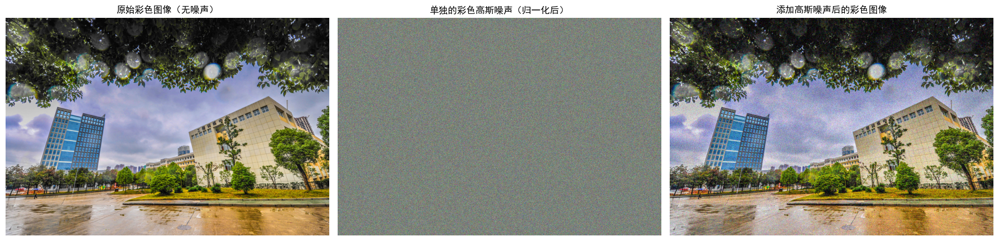

In [85]:
# 生成彩色噪声图像和单独噪声矩阵
img_noisy_bgr, gaussian_noise_color = add_gaussian_noise(img_original_bgr, var=noise_var)

# 转换色彩空间（OpenCV BGR → Matplotlib RGB，解决颜色偏差）
img_original_rgb = cv2.cvtColor(img_original_bgr, cv2.COLOR_BGR2RGB)
img_noisy_rgb = cv2.cvtColor(img_noisy_bgr, cv2.COLOR_BGR2RGB)

# 可视化：原始彩色图 + 单独彩色噪声 + 带噪声彩色图
plt.figure(figsize=(18, 6))

# 子图1：原始彩色图像
plt.subplot(1, 3, 1)
plt.imshow(img_original_rgb)
plt.title("原始彩色图像（无噪声）")
plt.axis("off")

# 子图2：单独的彩色高斯噪声
plt.subplot(1, 3, 2)
plt.imshow(gaussian_noise_color)
plt.title("单独的彩色高斯噪声（归一化后）")
plt.axis("off")

# 子图3：添加噪声后的彩色图像
plt.subplot(1, 3, 3)
plt.imshow(img_noisy_rgb)
plt.title("添加高斯噪声后的彩色图像")
plt.axis("off")

plt.tight_layout()
plt.show()

In [86]:
# 生成3×3和15×15高斯核
gaussian_3x3 = create_gaussian_kernel(kernel_3x3, sigma_3x3)
gaussian_15x15 = create_gaussian_kernel(kernel_15x15, sigma_15x15)

# 打印高斯核详细信息，验证归一化效果
print("=== 3×3高斯核 ===")
print("高精度高斯核：")
print(gaussian_3x3)
print("\n保留3位小数高斯核：")
print(np.round(gaussian_3x3, 3))
print("\n高斯核权重总和（验证是否≈1）：", np.sum(gaussian_3x3))

print("\n=== 15×15高斯核 ===")
print(f"15×15高斯核权重总和（验证是否≈1）：{np.sum(gaussian_15x15):.6f}")

=== 3×3高斯核 ===
高精度高斯核：
[[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]

保留3位小数高斯核：
[[0.075 0.124 0.075]
 [0.124 0.204 0.124]
 [0.075 0.124 0.075]]

高斯核权重总和（验证是否≈1）： 1.0

=== 15×15高斯核 ===
15×15高斯核权重总和（验证是否≈1）：1.000000


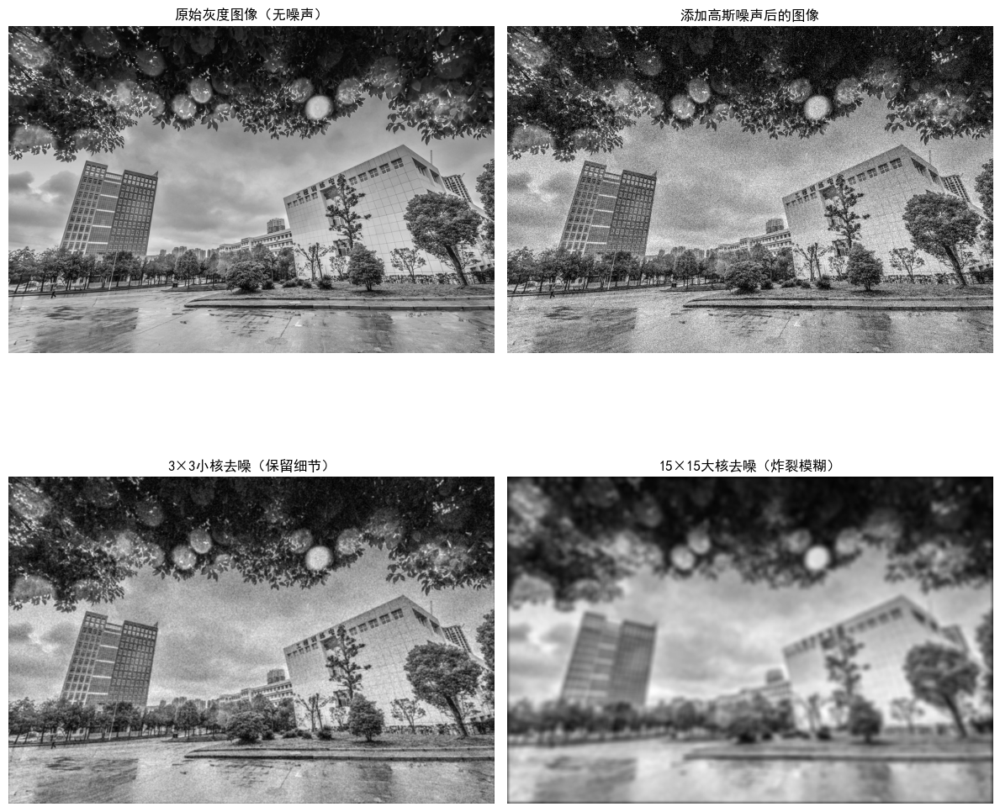

In [87]:
# 转换为灰度图并添加高斯噪声
gray_img_original = cv2.cvtColor(img_original_bgr, cv2.COLOR_BGR2GRAY)
gray_img_noisy, _ = add_gaussian_noise(gray_img_original, var=noise_var)

# 执行手动高斯滤波（3×3小核 + 15×15大核）
blur_manual_3x3 = manual_gaussian_filter(gray_img_noisy, kernel_3x3, sigma_3x3)
blur_manual_15x15 = manual_gaussian_filter(gray_img_noisy, kernel_15x15, sigma_15x15)

# 可视化灰度图滤波结果（2×2布局）
plt.figure(figsize=(12, 12))

# 子图1：原始灰度图像
plt.subplot(2, 2, 1)
plt.imshow(gray_img_original, cmap="gray")
plt.title("原始灰度图像（无噪声）")
plt.axis("off")

# 子图2：添加噪声后的灰度图像
plt.subplot(2, 2, 2)
plt.imshow(gray_img_noisy, cmap="gray")
plt.title("添加高斯噪声后的图像")
plt.axis("off")

# 子图3：3×3小核去噪结果
plt.subplot(2, 2, 3)
plt.imshow(blur_manual_3x3, cmap="gray")
plt.title("3×3小核去噪（保留细节）")
plt.axis("off")

# 子图4：15×15大核去噪结果
plt.subplot(2, 2, 4)
plt.imshow(blur_manual_15x15, cmap="gray")
plt.title("15×15大核去噪（炸裂模糊）")
plt.axis("off")

plt.tight_layout()
plt.show()

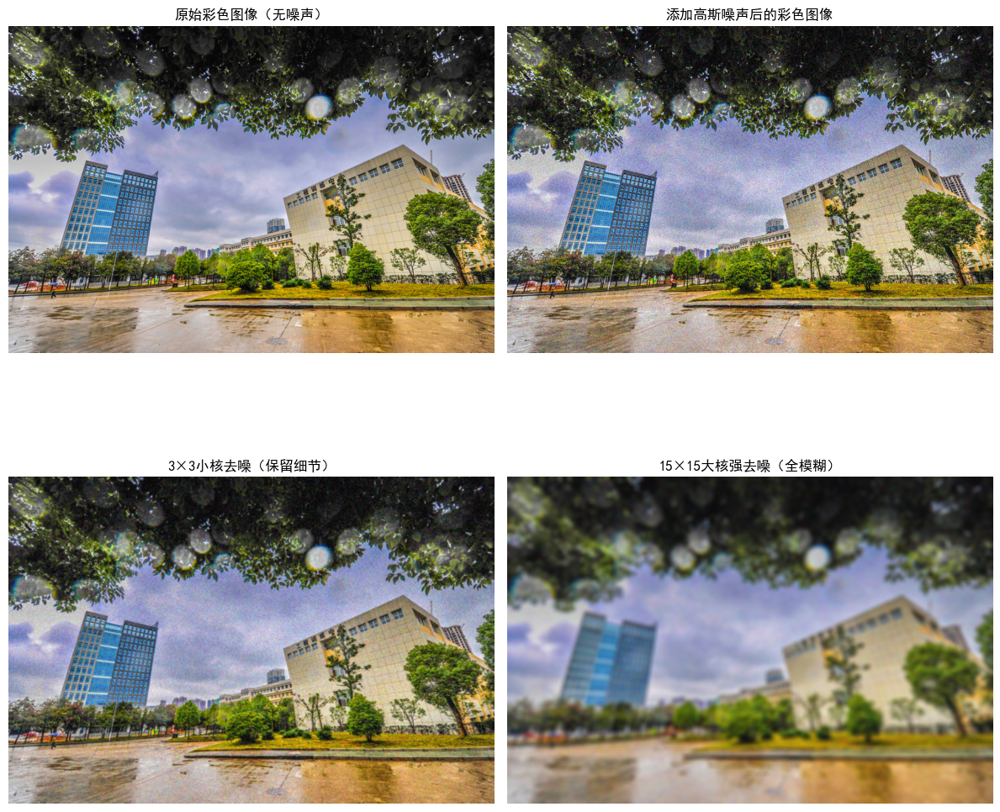

In [88]:
# 彩色图OpenCV高斯滤波
blur_cv2_3x3 = cv2.GaussianBlur(img_noisy_bgr, (kernel_3x3, kernel_3x3), sigmaX=sigma_3x3)
blur_cv2_15x15 = cv2.GaussianBlur(img_noisy_bgr, (kernel_15x15, kernel_15x15), sigmaX=sigma_15x15)

# 转换彩色滤波结果为RGB格式（用于Matplotlib可视化）
blur_cv2_3x3_rgb = cv2.cvtColor(blur_cv2_3x3, cv2.COLOR_BGR2RGB)
blur_cv2_15x15_rgb = cv2.cvtColor(blur_cv2_15x15, cv2.COLOR_BGR2RGB)

# 可视化彩色图滤波结果（2×2布局）
plt.figure(figsize=(12, 12))

# 子图1：原始彩色图像
plt.subplot(2, 2, 1)
plt.imshow(img_original_rgb)
plt.title("原始彩色图像（无噪声）")
plt.axis("off")

# 子图2：添加噪声后的彩色图像
plt.subplot(2, 2, 2)
plt.imshow(img_noisy_rgb)
plt.title("添加高斯噪声后的彩色图像")
plt.axis("off")

# 子图3：3×3小核OpenCV去噪结果
plt.subplot(2, 2, 3)
plt.imshow(blur_cv2_3x3_rgb)
plt.title("3×3小核去噪（保留细节）")
plt.axis("off")

# 子图4：15×15大核OpenCV去噪结果
plt.subplot(2, 2, 4)
plt.imshow(blur_cv2_15x15_rgb)
plt.title("15×15大核强去噪（全模糊）")
plt.axis("off")

plt.tight_layout()
plt.show()

=== 3×3小核 手动实现 vs OpenCV封装函数 去噪结果对比 ===
像素差异最大值：255
像素差异平均值：4.7797

=== 15×15大核（炸裂效果） 手动实现 vs OpenCV封装函数 去噪结果对比 ===
像素差异最大值：255
像素差异平均值：15.8595


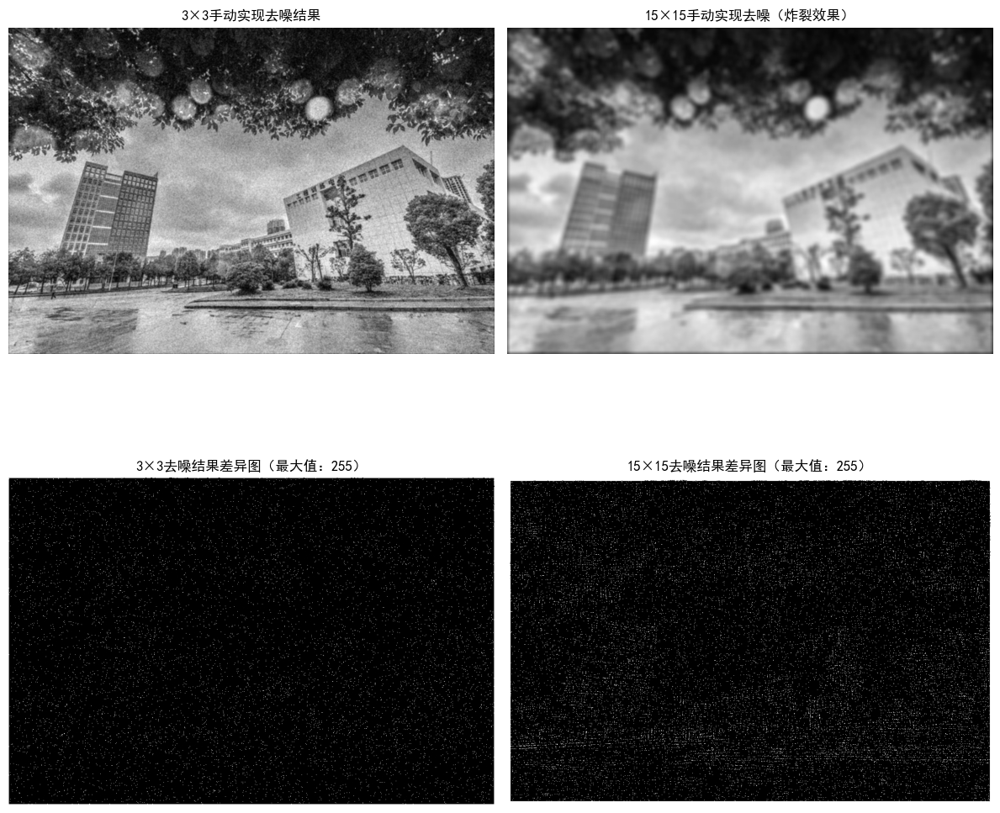

In [89]:
# 灰度图OpenCV高斯滤波（用于后续差异对比）
blur_cv2_gray_3x3 = cv2.GaussianBlur(gray_img_noisy, (kernel_3x3, kernel_3x3), sigmaX=sigma_3x3)
blur_cv2_gray_15x15 = cv2.GaussianBlur(gray_img_noisy, (kernel_15x15, kernel_15x15), sigmaX=sigma_15x15)

# 统一数据类型+裁剪数值范围，解决差异值异常问题
blur_manual_3x3 = np.uint8(np.clip(blur_manual_3x3, 0, 255))
blur_cv2_gray_3x3 = np.uint8(np.clip(blur_cv2_gray_3x3, 0, 255))
blur_manual_15x15 = np.uint8(np.clip(blur_manual_15x15, 0, 255))
blur_cv2_gray_15x15 = np.uint8(np.clip(blur_cv2_gray_15x15, 0, 255))

# 计算像素差异
diff_3x3 = np.abs(blur_manual_3x3 - blur_cv2_gray_3x3)
max_diff_3x3 = np.max(diff_3x3)
mean_diff_3x3 = np.mean(diff_3x3)

diff_15x15 = np.abs(blur_manual_15x15 - blur_cv2_gray_15x15)
max_diff_15x15 = np.max(diff_15x15)
mean_diff_15x15 = np.mean(diff_15x15)

# 打印量化差异结果
print("=== 3×3小核 手动实现 vs OpenCV封装函数 去噪结果对比 ===")
print(f"像素差异最大值：{max_diff_3x3}")
print(f"像素差异平均值：{mean_diff_3x3:.4f}")

print("\n=== 15×15大核（炸裂效果） 手动实现 vs OpenCV封装函数 去噪结果对比 ===")
print(f"像素差异最大值：{max_diff_15x15}")
print(f"像素差异平均值：{mean_diff_15x15:.4f}")

# 可视化差异结果（优化细微差异显示）
plt.figure(figsize=(12, 12))

# 子图1：3×3手动去噪结果
plt.subplot(2, 2, 1)
plt.imshow(blur_manual_3x3, cmap="gray")
plt.title("3×3手动实现去噪结果")
plt.axis("off")

# 子图2：15×15手动去噪结果
plt.subplot(2, 2, 2)
plt.imshow(blur_manual_15x15, cmap="gray")
plt.title("15×15手动实现去噪（炸裂效果）")
plt.axis("off")

# 子图3：3×3差异图
plt.subplot(2, 2, 3)
plt.imshow(diff_3x3, cmap="gray", vmin=0, vmax=np.min([max_diff_3x3, 50]))
plt.title(f"3×3去噪结果差异图（最大值：{max_diff_3x3}）")
plt.axis("off")

# 子图4：15×15差异图
plt.subplot(2, 2, 4)
plt.imshow(diff_15x15, cmap="gray", vmin=0, vmax=np.min([max_diff_15x15, 50]))
plt.title(f"15×15去噪结果差异图（最大值：{max_diff_15x15}）")
plt.axis("off")

plt.tight_layout()
plt.show()

In [90]:
# 读取原始图像（OpenCV默认BGR格式）
img = cv2.imread("../img/wuhues.jpg")
# BGR 转 RGB（适配Matplotlib可视化，解决颜色偏差问题）
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 为图像添加高斯噪声（模拟真实场景中的噪声干扰）
np.random.seed(42)
noise = np.random.normal(0, 0.05, img.shape).astype(np.float32)
img_float = img.astype(np.float32) / 255.0
noisy_img_float = img_float + noise
noisy_img = np.clip(noisy_img_float * 255.0, 0, 255).astype(np.uint8)
noisy_img_rgb = cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB)

# 执行OpenCV高斯滤波（两种核尺寸对比）
# 3×3 小核高斯滤波（轻量模糊，保留更多细节）
filtered_img_3 = cv2.GaussianBlur(noisy_img, ksize=(3, 3), sigmaX=1.0)
filtered_img_3_rgb = cv2.cvtColor(filtered_img_3, cv2.COLOR_BGR2RGB)

# 15×15 大核高斯滤波（重度模糊，强去噪效果）
filtered_img_15 = cv2.GaussianBlur(noisy_img, ksize=(15, 15), sigmaX=5.0)
filtered_img_15_rgb = cv2.cvtColor(filtered_img_15, cv2.COLOR_BGR2RGB)

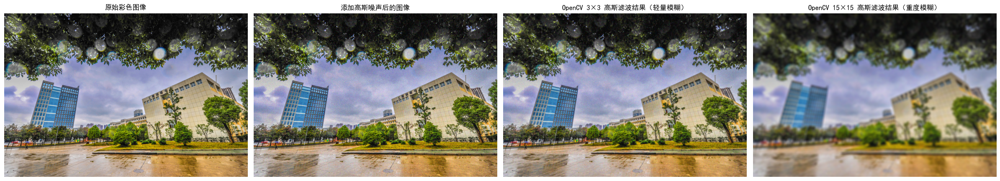

In [91]:
plt.figure(figsize=(24, 6))  # 调整画布尺寸，适配1行4列布局（宽屏更舒展）
plt.subplot(1, 4, 1)
plt.imshow(img_rgb)
plt.title("原始彩色图像", fontsize=12)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(noisy_img_rgb)
plt.title("添加高斯噪声后的图像", fontsize=12)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(filtered_img_3_rgb)
plt.title("OpenCV 3×3 高斯滤波结果（轻量模糊）", fontsize=12)
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(filtered_img_15_rgb)
plt.title("OpenCV 15×15 高斯滤波结果（重度模糊）", fontsize=12)
plt.axis('off')

plt.tight_layout()
plt.show()